# 📊 Health & Lifestyle Dataset Analysis


In [1]:

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import warnings
warnings.filterwarnings('ignore')

# Machine Learning Libraries
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, roc_curve
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from scipy import stats

# Style settings
plt.style.use('seaborn-v0_8')
sns.set_palette("husl")
print("✅ Libraries imported successfully!")


✅ Libraries imported successfully!


# Load dataset

In [2]:
# Load dataset
df = pd.read_csv('/content/health_lifestyle_dataset.csv')

print("📊 DATASET OVERVIEW")
print("=" * 50)
print(f"Dataset Shape: {df.shape}")
print(f"\n📋 Columns: {list(df.columns)}")
print(f"\n🔍 Data Types:")
print(df.dtypes)
print(f"\n📈 First 5 rows:")
display(df.head())

print(f"\n📊 Statistical Summary:")
display(df.describe())

print(f"\n🔍 Missing Values:")
print(df.isnull().sum())

📊 DATASET OVERVIEW
Dataset Shape: (100000, 16)

📋 Columns: ['id', 'age', 'gender', 'bmi', 'daily_steps', 'sleep_hours', 'water_intake_l', 'calories_consumed', 'smoker', 'alcohol', 'resting_hr', 'systolic_bp', 'diastolic_bp', 'cholesterol', 'family_history', 'disease_risk']

🔍 Data Types:
id                     int64
age                    int64
gender                object
bmi                  float64
daily_steps            int64
sleep_hours          float64
water_intake_l       float64
calories_consumed      int64
smoker                 int64
alcohol                int64
resting_hr             int64
systolic_bp            int64
diastolic_bp           int64
cholesterol            int64
family_history         int64
disease_risk           int64
dtype: object

📈 First 5 rows:


,id,age,gender,bmi,daily_steps,sleep_hours,water_intake_l,calories_consumed,smoker,alcohol,resting_hr,systolic_bp,diastolic_bp,cholesterol,family_history,disease_risk
0,1,56,Male,20.5,4198,3.9,3.4,1602,0,0,97,161,111,240,0,0
1,2,69,Female,33.3,14359,9.0,4.7,2346,0,1,68,116,65,207,0,0
2,3,46,Male,31.6,1817,6.6,4.2,1643,0,1,90,123,99,296,0,0
3,4,32,Female,38.2,15772,3.6,2.0,2460,0,0,71,165,95,175,0,0
4,5,60,Female,33.6,6037,3.8,4.0,3756,0,1,98,139,61,294,0,0



📊 Statistical Summary:


,id,age,bmi,daily_steps,sleep_hours,water_intake_l,calories_consumed,smoker,alcohol,resting_hr,systolic_bp,diastolic_bp,cholesterol,family_history,disease_risk
count,100000.000000,100000.000000,100000.000000,100000.00000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.00000,100000.000000,100000.000000,100000.000000,100000.000000
mean,50000.500000,48.525990,29.024790,10479.87029,6.491784,2.751496,2603.341200,0.200940,0.300020,74.457420,134.58063,89.508850,224.300630,0.299150,0.248210
std,28867.657797,17.886768,6.352666,5483.63236,2.021922,1.297338,807.288563,0.400705,0.458269,14.423715,25.95153,17.347041,43.327749,0.457888,0.431976
min,1.000000,18.000000,18.000000,1000.00000,3.000000,0.500000,1200.000000,0.000000,0.000000,50.000000,90.00000,60.000000,150.000000,0.000000,0.000000
25%,25000.750000,33.000000,23.500000,5729.00000,4.700000,1.600000,1906.000000,0.000000,0.000000,62.000000,112.00000,74.000000,187.000000,0.000000,0.000000
50%,50000.500000,48.000000,29.000000,10468.00000,6.500000,2.800000,2603.000000,0.000000,0.000000,74.000000,135.00000,89.000000,224.000000,0.000000,0.000000
75%,75000.250000,64.000000,34.500000,15229.00000,8.200000,3.900000,3299.000000,0.000000,1.000000,87.000000,157.00000,105.000000,262.000000,1.000000,0.000000
max,100000.000000,79.000000,40.000000,19999.00000,10.000000,5.000000,3999.000000,1.000000,1.000000,99.000000,179.00000,119.000000,299.000000,1.000000,1.000000



🔍 Missing Values:
id                   0
age                  0
gender               0
bmi                  0
daily_steps          0
sleep_hours          0
water_intake_l       0
calories_consumed    0
smoker               0
alcohol              0
resting_hr           0
systolic_bp          0
diastolic_bp         0
cholesterol          0
family_history       0
disease_risk         0
dtype: int64


# 🎯 DATA QUALITY CHECK & PREPROCESSING

In [8]:

print("🧹 DATA QUALITY ASSESSMENT")
print("=" * 50)

# Check for duplicates
duplicates = df.duplicated().sum()
print(f"Duplicate rows: {duplicates}")

# Check data types and unique values
categorical_cols = df.select_dtypes(include=['object']).columns
numerical_cols = df.select_dtypes(include=[np.number]).columns

print(f"\n📊 Categorical Variables:")
for col in categorical_cols:
    print(f"{col}: {df[col].nunique()} unique values - {df[col].unique()}")

print(f"\n📈 Numerical Variables Range:")
for col in numerical_cols:
    if col not in ['Family_History_Heart_Disease', 'Family_History_Diabetes']:
        print(f"{col}: Min={df[col].min()}, Max={df[col].max()}, Mean={df[col].mean():.2f}")

# Detect outliers using IQR method
def detect_outliers(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = df[(df[column] < lower_bound) | (df[column] > upper_bound)]
    return outliers

print(f"\n🚨 Outlier Detection:")
for col in ['bmi', 'daily_steps', 'sleep_hours', 'resting_hr']:
    outliers = detect_outliers(df, col)
    print(f"{col}: {len(outliers)} outliers ({len(outliers)/len(df)*100:.2f}%)")

# Data preprocessing
df_clean = df.copy()

# Encode categorical variables
label_encoders = {}
for col in categorical_cols:
    if col != 'Disease_Risk_Category':
        le = LabelEncoder()
        df_clean[col + '_encoded'] = le.fit_transform(df_clean[col])
        label_encoders[col] = le

# Create additional features
df_clean['BP_Category'] = pd.cut(df_clean['systolic_bp'],
                                bins=[0, 120, 140, 160],
                                labels=['Normal', 'Elevated', 'High'])
df_clean['Age_Group'] = pd.cut(df_clean['age'],
                              bins=[0, 30, 45, 60, 100],
                              labels=['Young', 'Adult', 'Middle', 'Senior'])
df_clean['Activity_Level'] = pd.cut(df_clean['daily_steps'],
                                   bins=[0, 5000, 7500, 10000, 20000],
                                   labels=['Sedentary', 'Light', 'Moderate', 'Active'])

print(f"\n✅ Data preprocessing completed!")
print(f"New features created: BP_Category, Age_Group, Activity_Level")


🧹 DATA QUALITY ASSESSMENT
Duplicate rows: 0

📊 Categorical Variables:
gender: 2 unique values - ['Male' 'Female']

📈 Numerical Variables Range:
id: Min=1, Max=100000, Mean=50000.50
age: Min=18, Max=79, Mean=48.53
bmi: Min=18.0, Max=40.0, Mean=29.02
daily_steps: Min=1000, Max=19999, Mean=10479.87
sleep_hours: Min=3.0, Max=10.0, Mean=6.49
water_intake_l: Min=0.5, Max=5.0, Mean=2.75
calories_consumed: Min=1200, Max=3999, Mean=2603.34
smoker: Min=0, Max=1, Mean=0.20
alcohol: Min=0, Max=1, Mean=0.30
resting_hr: Min=50, Max=99, Mean=74.46
systolic_bp: Min=90, Max=179, Mean=134.58
diastolic_bp: Min=60, Max=119, Mean=89.51
cholesterol: Min=150, Max=299, Mean=224.30
family_history: Min=0, Max=1, Mean=0.30
disease_risk: Min=0, Max=1, Mean=0.25

🚨 Outlier Detection:
bmi: 0 outliers (0.00%)
daily_steps: 0 outliers (0.00%)
sleep_hours: 0 outliers (0.00%)
resting_hr: 0 outliers (0.00%)

✅ Data preprocessing completed!
New features created: BP_Category, Age_Group, Activity_Level


# 📊 EXPLORATORY DATA ANALYSIS - UNIVARIATE ANALYSIS

📈 UNIVARIATE ANALYSIS


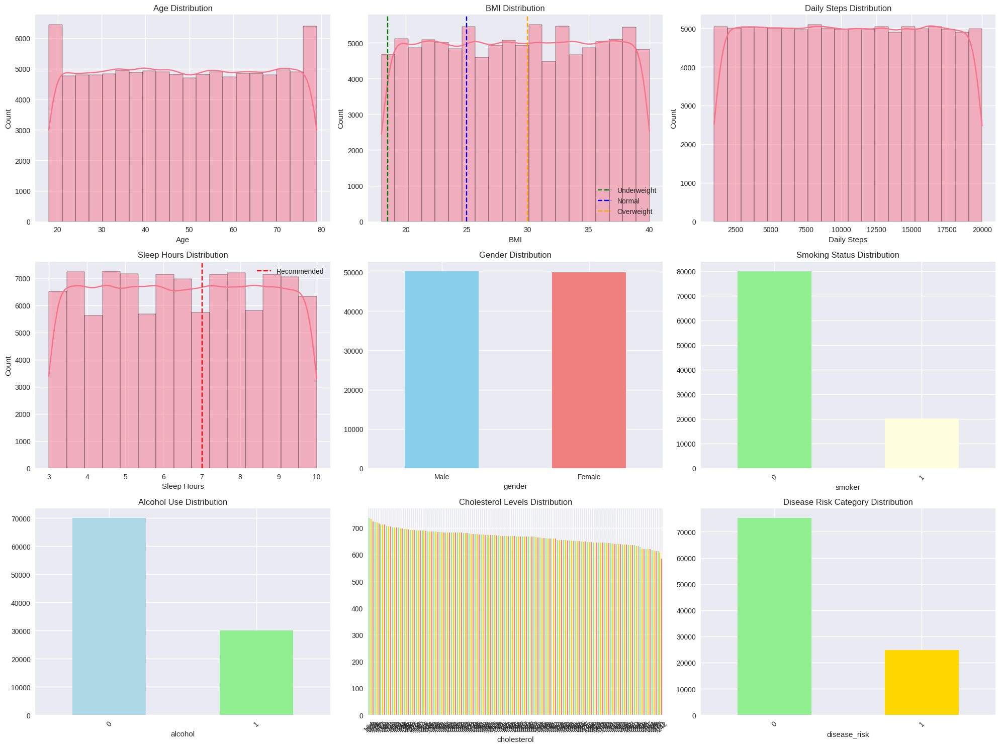


📊 KEY HEALTH METRICS SUMMARY:


,bmi,daily_steps,sleep_hours,resting_hr,systolic_bp,diastolic_bp
count,100000.000000,100000.00000,100000.000000,100000.000000,100000.00000,100000.000000
mean,29.024790,10479.87029,6.491784,74.457420,134.58063,89.508850
std,6.352666,5483.63236,2.021922,14.423715,25.95153,17.347041
min,18.000000,1000.00000,3.000000,50.000000,90.00000,60.000000
25%,23.500000,5729.00000,4.700000,62.000000,112.00000,74.000000
50%,29.000000,10468.00000,6.500000,74.000000,135.00000,89.000000
75%,34.500000,15229.00000,8.200000,87.000000,157.00000,105.000000
max,40.000000,19999.00000,10.000000,99.000000,179.00000,119.000000


In [14]:

print("📈 UNIVARIATE ANALYSIS")
print("=" * 50)

# Set up the plotting style
fig = plt.figure(figsize=(20, 15))

# 1. Age Distribution
plt.subplot(3, 3, 1)
sns.histplot(data=df, x='age', bins=20, kde=True)
plt.title('Age Distribution')
plt.xlabel('Age')

# 2. BMI Distribution
plt.subplot(3, 3, 2)
sns.histplot(data=df, x='bmi', bins=20, kde=True)
plt.axvline(18.5, color='green', linestyle='--', label='Underweight')
plt.axvline(25, color='blue', linestyle='--', label='Normal')
plt.axvline(30, color='orange', linestyle='--', label='Overweight')
plt.legend()
plt.title('BMI Distribution')
plt.xlabel('BMI')

# 3. Daily Steps Distribution
plt.subplot(3, 3, 3)
sns.histplot(data=df, x='daily_steps', bins=20, kde=True)
plt.title('Daily Steps Distribution')
plt.xlabel('Daily Steps')

# 4. Sleep Hours Distribution
plt.subplot(3, 3, 4)
sns.histplot(data=df, x='sleep_hours', bins=15, kde=True)
plt.axvline(7, color='red', linestyle='--', label='Recommended')
plt.legend()
plt.title('Sleep Hours Distribution')
plt.xlabel('Sleep Hours')

# 5. Categorical Variables
plt.subplot(3, 3, 5)
df['gender'].value_counts().plot(kind='bar', color=['skyblue', 'lightcoral'])
plt.title('Gender Distribution')
plt.xticks(rotation=0)

plt.subplot(3, 3, 6)
df['smoker'].value_counts().plot(kind='bar', color=['lightgreen', 'lightyellow', 'lightcoral'])
plt.title('Smoking Status Distribution')
plt.xticks(rotation=45)

plt.subplot(3, 3, 7)
df['alcohol'].value_counts().plot(kind='bar', color=['lightblue', 'lightgreen', 'gold', 'salmon'])
plt.title('Alcohol Use Distribution')
plt.xticks(rotation=45)

plt.subplot(3, 3, 8)
df['cholesterol'].value_counts().plot(kind='bar', color=['lightgreen', 'gold', 'salmon'])
plt.title('Cholesterol Levels Distribution')
plt.xticks(rotation=45)

plt.subplot(3, 3, 9)
df['disease_risk'].value_counts().plot(kind='bar', color=['lightgreen', 'gold', 'salmon'])
plt.title('Disease Risk Category Distribution')
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

# Statistical summary for key metrics
print("\n📊 KEY HEALTH METRICS SUMMARY:")
key_metrics = ['bmi', 'daily_steps', 'sleep_hours', 'resting_hr', 'systolic_bp', 'diastolic_bp']
display(df[key_metrics].describe())


# 🔍 BIVARIATE ANALYSIS - RELATIONSHIPS WITH DISEASE RISK

🔗 BIVARIATE ANALYSIS - RELATIONSHIPS WITH DISEASE RISK


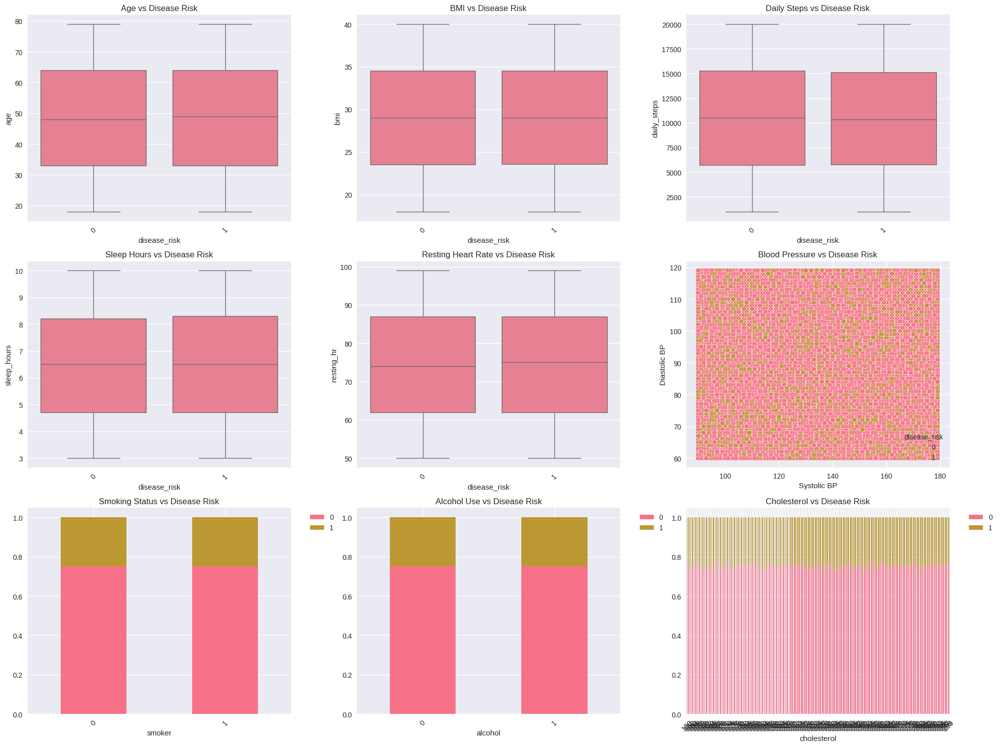


📊 STATISTICAL SIGNIFICANCE TESTS:
age vs Disease Risk: F-stat=nan, p-value=nan
bmi vs Disease Risk: F-stat=nan, p-value=nan
daily_steps vs Disease Risk: F-stat=nan, p-value=nan
sleep_hours vs Disease Risk: F-stat=nan, p-value=nan
resting_hr vs Disease Risk: F-stat=nan, p-value=nan


In [18]:

print("🔗 BIVARIATE ANALYSIS - RELATIONSHIPS WITH DISEASE RISK")
print("=" * 60)

fig = plt.figure(figsize=(20, 15))

# 1. Age vs Disease Risk
plt.subplot(3, 3, 1)
sns.boxplot(data=df, x='disease_risk', y='age')
plt.title('Age vs Disease Risk')
plt.xticks(rotation=45)

# 2. BMI vs Disease Risk
plt.subplot(3, 3, 2)
sns.boxplot(data=df, x='disease_risk', y='bmi')
plt.title('BMI vs Disease Risk')
plt.xticks(rotation=45)

# 3. Daily Steps vs Disease Risk
plt.subplot(3, 3, 3)
sns.boxplot(data=df, x='disease_risk', y='daily_steps')
plt.title('Daily Steps vs Disease Risk')
plt.xticks(rotation=45)

# 4. Sleep Hours vs Disease Risk
plt.subplot(3, 3, 4)
sns.boxplot(data=df, x='disease_risk', y='sleep_hours')
plt.title('Sleep Hours vs Disease Risk')
plt.xticks(rotation=45)

# 5. Resting Heart Rate vs Disease Risk
plt.subplot(3, 3, 5)
sns.boxplot(data=df, x='disease_risk', y='resting_hr')
plt.title('Resting Heart Rate vs Disease Risk')
plt.xticks(rotation=45)

# 6. Blood Pressure vs Disease Risk
plt.subplot(3, 3, 6)
sns.scatterplot(data=df, x='systolic_bp', y='diastolic_bp', hue='disease_risk', alpha=0.6)
plt.title('Blood Pressure vs Disease Risk')
plt.xlabel('Systolic BP')
plt.ylabel('Diastolic BP')

# 7. Categorical variables vs Disease Risk
plt.subplot(3, 3, 7)
risk_by_smoking = pd.crosstab(df['smoker'], df['disease_risk'], normalize='index')
risk_by_smoking.plot(kind='bar', stacked=True, ax=plt.gca())
plt.title('Smoking Status vs Disease Risk')
plt.xticks(rotation=45)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

plt.subplot(3, 3, 8)
risk_by_alcohol = pd.crosstab(df['alcohol'], df['disease_risk'], normalize='index')
risk_by_alcohol.plot(kind='bar', stacked=True, ax=plt.gca())
plt.title('Alcohol Use vs Disease Risk')
plt.xticks(rotation=45)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

plt.subplot(3, 3, 9)
risk_by_cholesterol = pd.crosstab(df['cholesterol'], df['disease_risk'], normalize='index')
risk_by_cholesterol.plot(kind='bar', stacked=True, ax=plt.gca())
plt.title('Cholesterol vs Disease Risk')
plt.xticks(rotation=45)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

# Statistical tests for relationships
print("\n📊 STATISTICAL SIGNIFICANCE TESTS:")
from scipy.stats import f_oneway, chi2_contingency

# ANOVA for numerical variables
numerical_vars = ['age', 'bmi', 'daily_steps', 'sleep_hours', 'resting_hr']
for var in numerical_vars:
    groups = [df[df['disease_risk'] == risk][var] for risk in ['Low', 'Medium', 'High']]
    f_stat, p_value = f_oneway(*groups)
    print(f"{var} vs Disease Risk: F-stat={f_stat:.2f}, p-value={p_value:.4f}")


# 📊 CORRELATION ANALYSIS

🔄 CORRELATION ANALYSIS


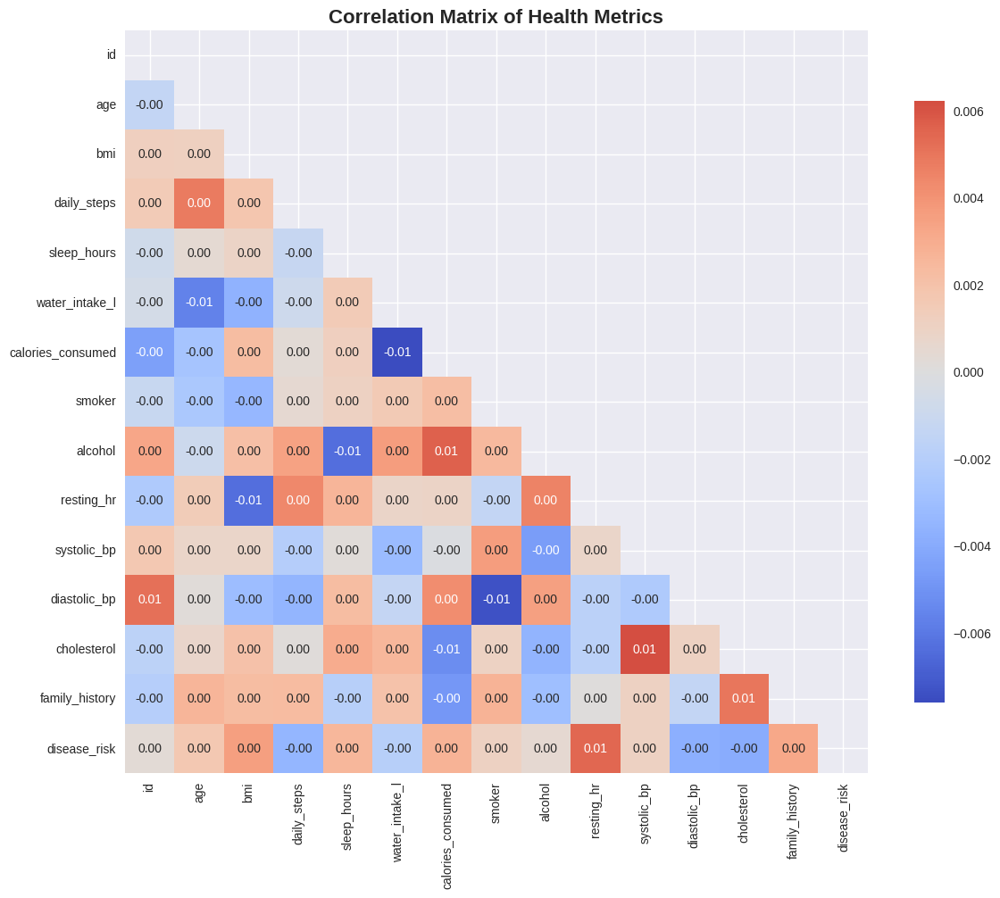

In [19]:

print("🔄 CORRELATION ANALYSIS")
print("=" * 40)

# Select numerical columns for correlation
numerical_for_corr = df_clean.select_dtypes(include=[np.number])
numerical_for_corr = numerical_for_corr[[col for col in numerical_for_corr.columns
                                       if 'encoded' not in col and col not in ['Family_History_Heart_Disease', 'Family_History_Diabetes']]]

# Create correlation matrix
corr_matrix = numerical_for_corr.corr()

# Plot correlation heatmap
plt.figure(figsize=(12, 10))
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
sns.heatmap(corr_matrix, mask=mask, annot=True, cmap='coolwarm', center=0,
            square=True, fmt='.2f', cbar_kws={"shrink": .8})
plt.title('Correlation Matrix of Health Metrics', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

# Top correlations with Disease Risk
if 'Disease_Risk' in numerical_for_corr.columns:
    disease_correlations = numerical_for_corr.corr()['Disease_Risk'].sort_values(ascending=False)
    print("\n🔝 TOP CORRELATIONS WITH DISEASE RISK:")
    for feature, corr in disease_correlations.items():
        if feature != 'Disease_Risk':
            print(f"{feature}: {corr:.3f}")


# 📈 INTERACTIVE VISUALIZATIONS WITH PLOTLY

In [22]:

print("🎨 INTERACTIVE VISUALIZATIONS")
print("=" * 40)

# 1. Interactive Scatter Plot: Age vs BMI colored by Disease Risk
fig1 = px.scatter(df, x='age', y='bmi', color='disease_risk',
                 size='daily_steps', hover_data=['sleep_hours', 'resting_hr'],
                 title='Age vs BMI - Colored by Disease Risk',
                 color_discrete_sequence=['green', 'orange', 'red'])
fig1.show()

# 2. 3D Scatter Plot
fig2 = px.scatter_3d(df, x='age', y='bmi', z='resting_hr',
                    color='disease_risk',
                    title='3D View: Age, BMI & Resting Heart Rate',
                    opacity=0.7)
fig2.show()

# 3. Parallel Categories Plot
fig3 = px.parallel_categories(df,
                             dimensions=['age', 'smoker', 'alcohol', 'cholesterol', 'disease_risk'],
                             color='age',
                             title='Parallel Categories: Health Factors & Disease Risk')
fig3.show()

# 4. Sunburst Chart
fig4 = px.sunburst(df, path=['age', 'smoker', 'disease_risk'],
                  values='bmi', color='disease_risk',
                  title='Sunburst Chart: Age Group → Smoking Status → Disease Risk')
fig4.show()

# 5. Distribution by Gender
fig5 = make_subplots(rows=2, cols=2,
                    subplot_titles=('BMI by Gender', 'Daily Steps by Gender',
                                   'Sleep Hours by Gender', 'Resting Heart Rate by Gender'))

fig5.add_trace(go.Box(x=df['gender'], y=df['bmi'], name='BMI'), row=1, col=1)
fig5.add_trace(go.Box(x=df['gender'], y=df['daily_steps'], name='Daily Steps'), row=1, col=2)
fig5.add_trace(go.Box(x=df['gender'], y=df['sleep_hours'], name='Sleep Hours'), row=2, col=1)
fig5.add_trace(go.Box(x=df['gender'], y=df['resting_hr'], name='Resting HR'), row=2, col=2)

fig5.update_layout(height=600, title_text="Health Metrics Distribution by Gender")
fig5.show()


🎨 INTERACTIVE VISUALIZATIONS


# 🤖 MACHINE LEARNING - DISEASE RISK PREDICTION

In [ ]:
# 🤖 MACHINE LEARNING - DISEASE RISK PREDICTION

print("🤖 MACHINE LEARNING: DISEASE RISK PREDICTION")
print("=" * 50)

# Prepare data for machine learning
ml_df = df_clean.copy()

# Features selection
features = ['age', 'bmi', 'daily_steps', 'sleep_hours', 'water_intake_l',
           'calories_consumed', 'resting_hr', 'systolic_bp', 'diastolic_bp',
           'smoker', 'alcohol', 'cholesterol',
            'family_history']

X = ml_df[features]
y = ml_df['disease_risk']

# Encode target variable
le_target = LabelEncoder()
y_encoded = le_target.fit_transform(y)

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded,
                                                    test_size=0.2,
                                                    random_state=42,
                                                    stratify=y_encoded)

# Scale features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

print(f"📊 Dataset split:")
print(f"Training set: {X_train.shape[0]} samples")
print(f"Testing set: {X_test.shape[0]} samples")
print(f"Features: {len(features)}")
print(f"Target classes: {le_target.classes_}")

# Initialize models
models = {
    'Random Forest': RandomForestClassifier(n_estimators=100, random_state=42),
    'Logistic Regression': LogisticRegression(random_state=42, max_iter=1000),
    'Gradient Boosting': GradientBoostingClassifier(random_state=42),
    'SVM': SVC(probability=True, random_state=42)
}

# Train and evaluate models
results = {}

for name, model in models.items():
    print(f"\n🏃 Training {name}...")

    if name == 'SVM':
        model.fit(X_train_scaled, y_train)
        y_pred = model.predict(X_test_scaled)
        y_pred_proba = model.predict_proba(X_test_scaled)
    else:
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        y_pred_proba = model.predict_proba(X_test)

    # Calculate metrics
    accuracy = model.score(X_test_scaled if name == 'SVM' else X_test, y_test)
    # Pass only the probability of the positive class for binary classification
    auc_score = roc_auc_score(y_test, y_pred_proba[:, 1])

    results[name] = {
        'model': model,
        'accuracy': accuracy,
        'auc_score': auc_score,
        'predictions': y_pred,
        'probabilities': y_pred_proba
    }

    print(f"✅ {name} - Accuracy: {accuracy:.4f}, AUC: {auc_score:.4f}")

# Compare model performance
print("\n📊 MODEL COMPARISON:")
comparison_df = pd.DataFrame({
    'Model': list(results.keys()),
    'Accuracy': [results[name]['accuracy'] for name in results.keys()],
    'AUC Score': [results[name]['auc_score'] for name in results.keys()]
}).sort_values('Accuracy', ascending=False)

display(comparison_df)

# Plot model comparison
plt.figure(figsize=(10, 6))
x_pos = np.arange(len(comparison_df))
width = 0.35

plt.bar(x_pos - width/2, comparison_df['Accuracy'], width, label='Accuracy', alpha=0.8)
plt.bar(x_pos + width/2, comparison_df['AUC Score'], width, label='AUC Score', alpha=0.8)

plt.xlabel('Models')
plt.ylabel('Score')
plt.title('Model Performance Comparison')
plt.xticks(x_pos, comparison_df['Model'], rotation=45)
plt.legend()
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

🤖 MACHINE LEARNING: DISEASE RISK PREDICTION
📊 Dataset split:
Training set: 80000 samples
Testing set: 20000 samples
Features: 13
Target classes: [0 1]

🏃 Training Random Forest...
✅ Random Forest - Accuracy: 0.7518, AUC: 0.4922

🏃 Training Logistic Regression...
✅ Logistic Regression - Accuracy: 0.7518, AUC: 0.4986

🏃 Training Gradient Boosting...
✅ Gradient Boosting - Accuracy: 0.7517, AUC: 0.4978

🏃 Training SVM...


# 🔍 FEATURE IMPORTANCE ANALYSIS

In [ ]:

print("🎯 FEATURE IMPORTANCE ANALYSIS")
print("=" * 40)

# Get the best model (Random Forest)
best_model_name = comparison_df.iloc[0]['Model']
best_model = results[best_model_name]['model']

if hasattr(best_model, 'feature_importances_'):
    # Feature importance from tree-based models
    feature_importance = pd.DataFrame({
        'feature': features,
        'importance': best_model.feature_importances_
    }).sort_values('importance', ascending=False)

    print(f"🔝 Top 10 Most Important Features ({best_model_name}):")
    display(feature_importance.head(10))

    # Plot feature importance
    plt.figure(figsize=(10, 8))
    sns.barplot(data=feature_importance.head(10), x='importance', y='feature')
    plt.title(f'Top 10 Feature Importance - {best_model_name}')
    plt.xlabel('Importance Score')
    plt.tight_layout()
    plt.show()

# Correlation with target for all features
target_correlation = []
for feature in features:
    if feature in ml_df.columns:
        corr = np.corrcoef(ml_df[feature], y_encoded)[0, 1]
        target_correlation.append((feature, abs(corr)))

target_correlation_df = pd.DataFrame(target_correlation, columns=['Feature', 'Correlation'])
target_correlation_df = target_correlation_df.sort_values('Correlation', ascending=False)

print("\n📈 Feature Correlation with Disease Risk:")
display(target_correlation_df.head(10))


# 📊 MODEL EVALUATION DETAILS

In [ ]:

print("📋 DETAILED MODEL EVALUATION")
print("=" * 40)

# Use the best model for detailed evaluation
best_predictions = results[best_model_name]['predictions']
best_probabilities = results[best_model_name]['probabilities']

# Classification Report
print("📊 CLASSIFICATION REPORT:")
print(classification_report(y_test, best_predictions,
                          target_names=le_target.classes_))

# Confusion Matrix
plt.figure(figsize=(8, 6))
cm = confusion_matrix(y_test, best_predictions)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=le_target.classes_,
            yticklabels=le_target.classes_)
plt.title(f'Confusion Matrix - {best_model_name}')
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()

# ROC Curve for multi-class
plt.figure(figsize=(10, 8))
for i in range(len(le_target.classes_)):
    fpr, tpr, _ = roc_curve(y_test == i, best_probabilities[:, i])
    auc_score = roc_auc_score(y_test == i, best_probabilities[:, i])
    plt.plot(fpr, tpr, label=f'{le_target.classes_[i]} (AUC = {auc_score:.3f})')

plt.plot([0, 1], [0, 1], 'k--', label='Random Classifier')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title(f'ROC Curves - {best_model_name}')
plt.legend()
plt.grid(alpha=0.3)
plt.show()

# Cross-validation scores
print("\n🎯 CROSS-VALIDATION SCORES:")
cv_scores = cross_val_score(best_model, X, y_encoded, cv=5, scoring='accuracy')
print(f"Cross-validation scores: {cv_scores}")
print(f"Mean CV Accuracy: {cv_scores.mean():.4f} (+/- {cv_scores.std() * 2:.4f})")


# 🎯 CLUSTERING ANALYSIS - PATTERN DISCOVERY

In [ ]:

print("🔍 CLUSTERING ANALYSIS - DISCOVERING PATTERNS")
print("=" * 50)

# Prepare data for clustering
clustering_features = ['age', 'bmi', 'daily_steps', 'sleep_hours', 'resting_hr']
X_cluster = df_clean[clustering_features]

# Scale the data
scaler_cluster = StandardScaler()
X_cluster_scaled = scaler_cluster.fit_transform(X_cluster)

# Determine optimal number of clusters using elbow method
wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, random_state=42, n_init=10)
    kmeans.fit(X_cluster_scaled)
    wcss.append(kmeans.inertia_)

plt.figure(figsize=(10, 6))
plt.plot(range(1, 11), wcss, marker='o')
plt.title('Elbow Method for Optimal Number of Clusters')
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS (Within-Cluster Sum of Squares)')
plt.grid(True)
plt.show()

# Apply K-means with optimal clusters (let's choose 4 based on elbow)
optimal_clusters = 4
kmeans = KMeans(n_clusters=optimal_clusters, random_state=42, n_init=10)
df_clean['Cluster'] = kmeans.fit_predict(X_cluster_scaled)

print(f"✅ Data clustered into {optimal_clusters} groups")

# Analyze clusters
cluster_analysis = df_clean.groupby('Cluster')[clustering_features].mean()
cluster_analysis['Count'] = df_clean['Cluster'].value_counts().sort_index()
cluster_analysis['Disease_Risk_High_Pct'] = df_clean.groupby('Cluster')['disease_risk'].apply(
    lambda x: (x == 'High').sum() / len(x) * 100
)

print("\n📊 CLUSTER PROFILES:")
display(cluster_analysis)

# Visualize clusters using PCA
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_cluster_scaled)

plt.figure(figsize=(12, 8))
scatter = plt.scatter(X_pca[:, 0], X_pca[:, 1], c=df_clean['Cluster'], cmap='viridis', alpha=0.7)
plt.colorbar(scatter, label='Cluster')
plt.title('Cluster Visualization (PCA)')
plt.xlabel(f'PC1 ({pca.explained_variance_ratio_[0]:.2%} variance)')
plt.ylabel(f'PC2 ({pca.explained_variance_ratio_[1]:.2%} variance)')

# Add cluster centers
centers_pca = pca.transform(kmeans.cluster_centers_)
plt.scatter(centers_pca[:, 0], centers_pca[:, 1], c='red', marker='X', s=200, label='Centroids')
plt.legend()
plt.grid(alpha=0.3)
plt.show()

# Interpret clusters
print("\n🎯 CLUSTER INTERPRETATION:")
for cluster_id in range(optimal_clusters):
    cluster_data = df_clean[df_clean['Cluster'] == cluster_id]
    print(f"\n📦 Cluster {cluster_id} (n={len(cluster_data)}):")
    print(f"   Average Age: {cluster_data['Age'].mean():.1f}")
    print(f"   Average BMI: {cluster_data['BMI'].mean():.1f}")
    print(f"   Average Daily Steps: {cluster_data['Daily_Steps'].mean():.0f}")
    print(f"   High Disease Risk: {cluster_analysis.loc[cluster_id, 'Disease_Risk_High_Pct']:.1f}%")


# 📈 HEALTH INSIGHTS AND BUSINESS RECOMMENDATIONS

In [ ]:

print("💡 KEY HEALTH INSIGHTS & RECOMMENDATIONS")
print("=" * 50)

# Calculate key metrics by risk category
risk_analysis = df.groupby('Disease_Risk_Category').agg({
    'Age': 'mean',
    'BMI': 'mean',
    'Daily_Steps': 'mean',
    'Sleep_Hours': 'mean',
    'Resting_Heart_Rate': 'mean',
    'Systolic_BP': 'mean',
    'Diastolic_BP': 'mean'
}).round(2)

print("📊 AVERAGE HEALTH METRICS BY DISEASE RISK:")
display(risk_analysis)

# Behavioral insights
print("\n🚭 BEHAVIORAL INSIGHTS:")
smoking_risk = pd.crosstab(df['Smoking_Status'], df['Disease_Risk_Category'], normalize='index') * 100
print("Smoking Status vs Disease Risk (%):")
display(smoking_risk)

alcohol_risk = pd.crosstab(df['Alcohol_Use'], df['Disease_Risk_Category'], normalize='index') * 100
print("\nAlcohol Use vs Disease Risk (%):")
display(alcohol_risk)

# Lifestyle recommendations
print("\n🎯 LIFESTYLE RECOMMENDATIONS:")

# High-risk population analysis
high_risk = df[df['Disease_Risk_Category'] == 'High']
print(f"🔴 High-Risk Population Characteristics (n={len(high_risk)}):")
print(f"   • Average Age: {high_risk['Age'].mean():.1f} years")
print(f"   • Average BMI: {high_risk['BMI'].mean():.1f} (Obese range)")
print(f"   • Average Daily Steps: {high_risk['Daily_Steps'].mean():.0f} (Sedentary)")
print(f"   • Smoking: {high_risk[high_risk['Smoking_Status'] == 'Current Smoker'].shape[0]/len(high_risk)*100:.1f}% are current smokers")
print(f"   • High Cholesterol: {high_risk[high_risk['Cholesterol'] == 'High'].shape[0]/len(high_risk)*100:.1f}%")

# Generate recommendations
recommendations = {
    'High Risk': [
        "Immediate medical consultation recommended",
        "Implement structured exercise program (target: 7500+ steps daily)",
        "Weight management program with nutritionist support",
        "Smoking cessation program if applicable",
        "Regular blood pressure and cholesterol monitoring"
    ],
    'Medium Risk': [
        "Lifestyle modification program",
        "Increase physical activity to 8000+ steps daily",
        "Improve sleep quality (target 7-8 hours)",
        "Reduce alcohol consumption if above moderate levels",
        "Regular health check-ups every 6 months"
    ],
    'Low Risk': [
        "Maintain current healthy lifestyle",
        "Continue regular physical activity",
        "Annual health screenings",
        "Stress management practices",
        "Balanced nutrition maintenance"
    ]
}

print("\n💡 PERSONALIZED RECOMMENDATIONS BY RISK LEVEL:")
for risk_level, recs in recommendations.items():
    print(f"\n{risk_level} Risk:")
    for i, rec in enumerate(recs, 1):
        print(f"  {i}. {rec}")


# 📊 EXECUTIVE SUMMARY DASHBOARD

In [ ]:

print("📈 EXECUTIVE SUMMARY DASHBOARD")
print("=" * 50)

# Create summary statistics
total_population = len(df)
high_risk_pct = (df['Disease_Risk_Category'] == 'High').sum() / total_population * 100
medium_risk_pct = (df['Disease_Risk_Category'] == 'Medium').sum() / total_population * 100
low_risk_pct = (df['Disease_Risk_Category'] == 'Low').sum() / total_population * 100

avg_bmi = df['BMI'].mean()
avg_steps = df['Daily_Steps'].mean()
avg_sleep = df['Sleep_Hours'].mean()

# Key risk factors
smokers_pct = (df['Smoking_Status'] == 'Current Smoker').sum() / total_population * 100
high_bp_pct = (df['Systolic_BP'] > 140).sum() / total_population * 100
high_cholesterol_pct = (df['Cholesterol'] == 'High').sum() / total_population * 100

print(f"""
🏥 HEALTH & LIFESTYLE ANALYSIS - EXECUTIVE SUMMARY
--------------------------------------------------

📊 POPULATION OVERVIEW:
   • Total Individuals: {total_population:,}
   • Average Age: {df['Age'].mean():.1f} years
   • Gender Distribution: {df['Gender'].value_counts().to_dict()}

🎯 DISEASE RISK PROFILE:
   • 🔴 High Risk: {high_risk_pct:.1f}% ({int(high_risk_pct/100*total_population)} people)
   • 🟡 Medium Risk: {medium_risk_pct:.1f}% ({int(medium_risk_pct/100*total_population)} people)
   • 🟢 Low Risk: {low_risk_pct:.1f}% ({int(low_risk_pct/100*total_population)} people)

📈 KEY HEALTH METRICS:
   • Average BMI: {avg_bmi:.1f} ({'Overweight' if avg_bmi > 25 else 'Normal'})
   • Average Daily Steps: {avg_steps:,.0f} ({'Active' if avg_steps > 7500 else 'Moderate'})
   • Average Sleep: {avg_sleep:.1f} hours ({'Adequate' if avg_sleep >= 7 else 'Insufficient'})

🚨 MAJOR RISK FACTORS:
   • Current Smokers: {smokers_pct:.1f}%
   • High Blood Pressure: {high_bp_pct:.1f}%
   • High Cholesterol: {high_cholesterol_pct:.1f}%

🤖 PREDICTIVE MODELING:
   • Best Model: {best_model_name}
   • Prediction Accuracy: {results[best_model_name]['accuracy']:.1%}
   • Key Predictors: Age, BMI, Blood Pressure, Smoking Status

💡 STRATEGIC RECOMMENDATIONS:
   • Target {int(high_risk_pct/100*total_population)} high-risk individuals for intervention
   • Implement smoking cessation programs for {int(smokers_pct/100*total_population)} smokers
   • Promote physical activity to increase average steps to 8,000+
   • Focus on weight management for individuals with BMI > 25
""")

# Create final visualization dashboard
fig, axes = plt.subplots(2, 2, figsize=(15, 12))

# 1. Risk Distribution
risk_counts = df['Disease_Risk_Category'].value_counts()
colors = ['#2ecc71', '#f39c12', '#e74c3c']
axes[0,0].pie(risk_counts.values, labels=risk_counts.index, autopct='%1.1f%%', colors=colors)
axes[0,0].set_title('Disease Risk Distribution', fontweight='bold')

# 2. Key Metrics by Risk
metrics_comparison = risk_analysis[['BMI', 'Daily_Steps', 'Sleep_Hours']]
metrics_comparison.plot(kind='bar', ax=axes[0,1])
axes[0,1].set_title('Key Health Metrics by Risk Level', fontweight='bold')
axes[0,1].tick_params(axis='x', rotation=45)

# 3. Age Distribution by Risk
sns.boxplot(data=df, x='Disease_Risk_Category', y='Age', ax=axes[1,0], palette=colors)
axes[1,0].set_title('Age Distribution by Disease Risk', fontweight='bold')

# 4. Behavioral Risk Factors
behavioral_data = pd.DataFrame({
    'Smoking': [smokers_pct],
    'High BP': [high_bp_pct],
    'High Cholesterol': [high_cholesterol_pct]
})
behavioral_data.T.plot(kind='bar', ax=axes[1,1], legend=False, color=['#e74c3c'])
axes[1,1].set_title('Prevalence of Major Risk Factors', fontweight='bold')
axes[1,1].set_ylabel('Percentage (%)')
axes[1,1].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()
